In [1]:
import numpy as np
import matplotlib.pyplot as plt
from roulade import plot_roulade, roll_generator

Excercise 1 (Evaluation metrics) was moved to the end

## Excercise 2

In [2]:
from sklearn.decomposition import PCA
import pandas as pd
import seaborn as sns

def create_projected_image(
    save_image_name: str,
    show_plots: bool = True,
    **roll_kw
):
    points, d = roll_generator(to_array=True, **roll_kw)
    if show_plots:
        plot_roulade(*points.T, d)

    projected = PCA(n_components=2).fit_transform(points)
    df = pd.DataFrame(np.hstack((projected, np.array(d).reshape(-1, 1))), columns=['x', 'y', 'd'], )

    sns.scatterplot(df, x='x', y='y', hue='d', palette="coolwarm", legend=None)
    plt.axis("off")
    plt.savefig(f"saved_images/{save_image_name}", transparent=True)

    if show_plots:
        plt.show()
    else:
        plt.close()

Generating images

In [ ]:
import json
import itertools
import random

spiral_steps = [25, 50, 100]
spiral_density = [5, 10, 20]
width = [1, 5, 10]
angle = [0.1, 0.25, 0.5, 0.75, 1]
density = [5, 15, 30]

prod = itertools.product(spiral_steps, spiral_density, width, angle, density)
image_parameters = {}

for i, (a, b, c, d, e) in enumerate(random.sample(list(prod), 50)):
    create_projected_image(f"img_{i:02}.png", show_plots=False, spiral_steps=a, spiral_density=b, width=c, angle=d, density=e)
    image_parameters[f"img_{i:02}.png"] = {
        "spiral_steps": a,
        "spiral_density": b,
        "width": c,
        "angle": d,
        "density": e
    }


with open("saved_images/params.json", "w") as f:
    f.write(json.dumps(image_parameters, indent=4))

In [5]:
import os
from PIL import Image
from typing import Optional, Tuple

def read_img(img_path: str, resize: Optional[Tuple[int, int]] = None) -> Image.Image:
    img = Image.open(img_path)
    if resize:
        img = img.resize(resize)
    return img

image_folder = "saved_images"
image_paths = sorted([os.path.join(image_folder, filename) for filename in os.listdir(image_folder) if filename.endswith(".png")])
images = [read_img(img_path) for img_path in image_paths]

with open("saved_images/params.json", "r") as f:
    labels = json.load(f)
    
image_data_points = np.vstack([np.array(img).flatten() for img in images])

Example generated images

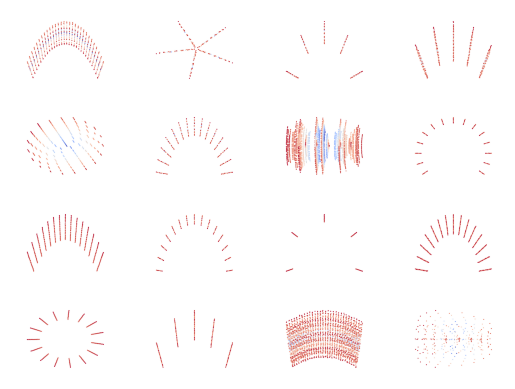

In [6]:
def show_image_grid(images: list[Image.Image], rows: int = 4, cols: int = 4):
    fig, ax = plt.subplots(rows, cols)
    for i in range(rows):
        for j in range(cols):
            image = images[i*rows + j]
            ax[i][j].imshow(image)
            ax[i][j].axis("off")
    plt.show()

show_image_grid(images[:16])

In [7]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap import UMAP
from trimap import TRIMAP
from pacmap import PaCMAP


def embedd_points(data_points: np.ndarray, algorithm: str, **alg_kw) -> np.ndarray:
    match algorithm:
        case "tsne":
            embedding_algo = TSNE(n_components=2, **alg_kw)
        case "umap":
            embedding_algo = UMAP(n_components=2, **alg_kw)
        case "trimap":
            embedding_algo = TRIMAP(n_dims=2, **alg_kw)
        case "pacmap":
            embedding_algo = PaCMAP(n_components=2, **alg_kw)
        case _:
            embedding_algo = PCA(n_components=2)

    points_transformed = embedding_algo.fit_transform(data_points)
    return points_transformed

In [8]:
import matplotlib.pyplot as plt
from PIL import Image
from matplotlib.table import Table
import numpy as np

def plot_embeddings_images(
    embeddings: np.ndarray, 
    images: list[Image.Image] | list[np.ndarray],
    labels: dict[str, dict[str, int | float]],
    figsize: tuple[int, int] = (12, 10),
    size: float = 0.02,
    **param
) -> None:
    
    x_min, x_max = np.min(embeddings, axis=0), np.max(embeddings, axis=0)
    norm_embeddings = (embeddings - x_min) / (x_max - x_min)

    fig, (ax_plot, ax_table) = plt.subplots(1, 2, figsize=figsize, gridspec_kw={'width_ratios': [3, 2]})

    for i, ((x, y), img) in enumerate(zip(norm_embeddings, images)):
        im_arr = np.array(img)
        ax_plot.imshow(im_arr, extent=(x - size, x + size, y - size, y + size), interpolation='none')
        ax_plot.text(x, y, i, fontsize=8, va='center', ha='left', color='black')

    ax_plot.set_xlim(0, 1)
    ax_plot.set_ylim(0, 1)
    ax_plot.axis('off')

    label_keys = sorted(labels.keys())
    headers = ['Index'] + list(labels[label_keys[0]].keys())
    cell_data = [[i] + list(labels[row].values()) for i, row in enumerate(label_keys)]

    table = ax_table.table(
        cellText=cell_data,
        colLabels=headers,
        cellLoc='center',
        loc='center'
    )
    table.auto_set_font_size(False)
    table.set_fontsize(8)
    table.scale(1, 0.8) 

    ax_table.axis('off')

    plt.title(param)
    plt.tight_layout()
    plt.show()

In [9]:
parameters = [
    {"algorithm": "pca"},
    {"algorithm": "tsne", "perplexity": 5},
    {"algorithm": "tsne", "perplexity": 15},
    {"algorithm": "tsne", "perplexity": 30},
    {"algorithm": "umap", "n_neighbors": 10, "min_dist": 0.1},
    {"algorithm": "umap", "n_neighbors": 15, "min_dist": 0.5},
    {"algorithm": "umap", "n_neighbors": 5, "min_dist": 0.5},
]

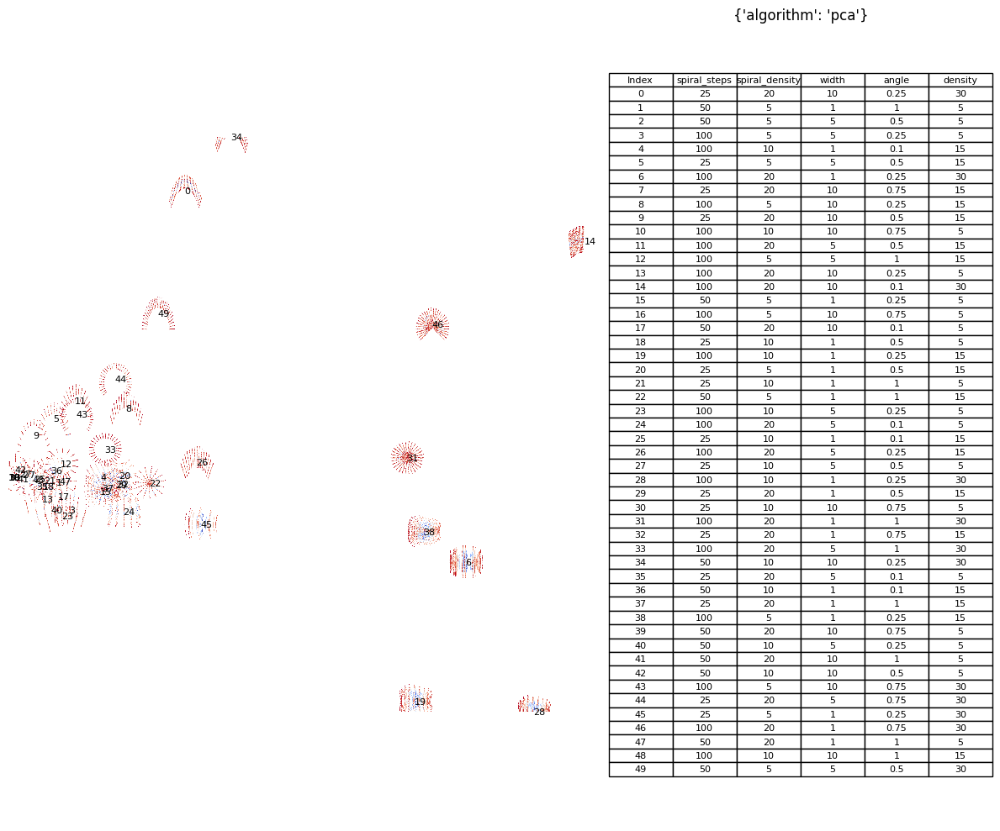

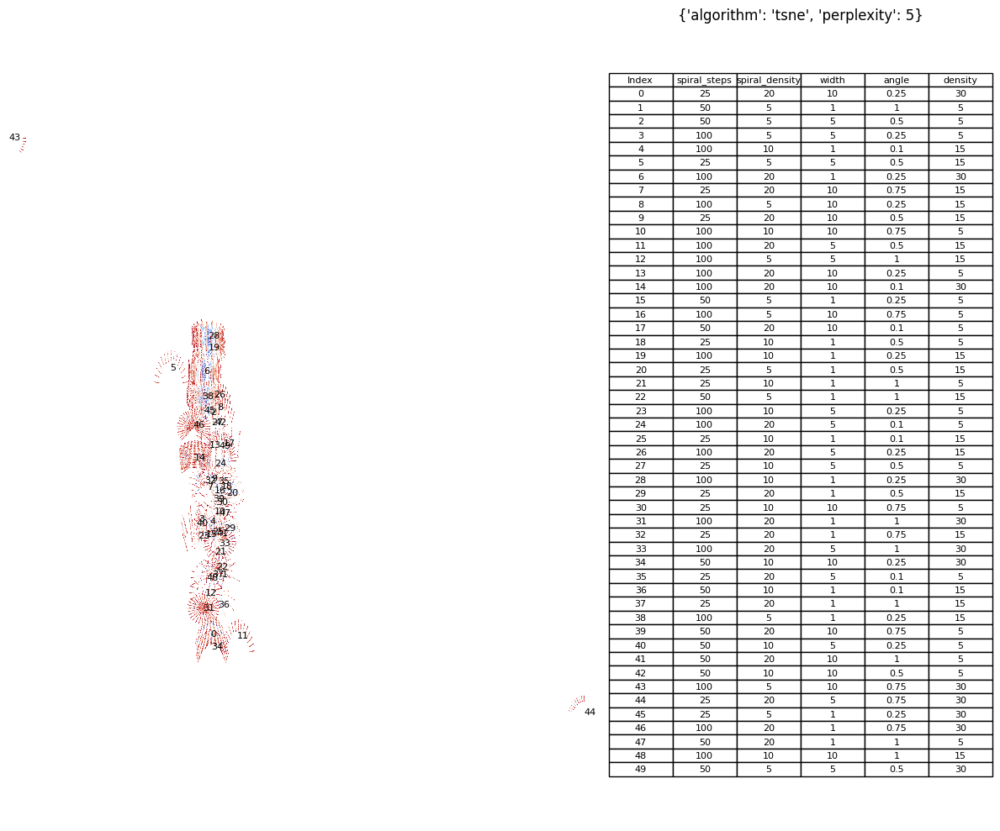

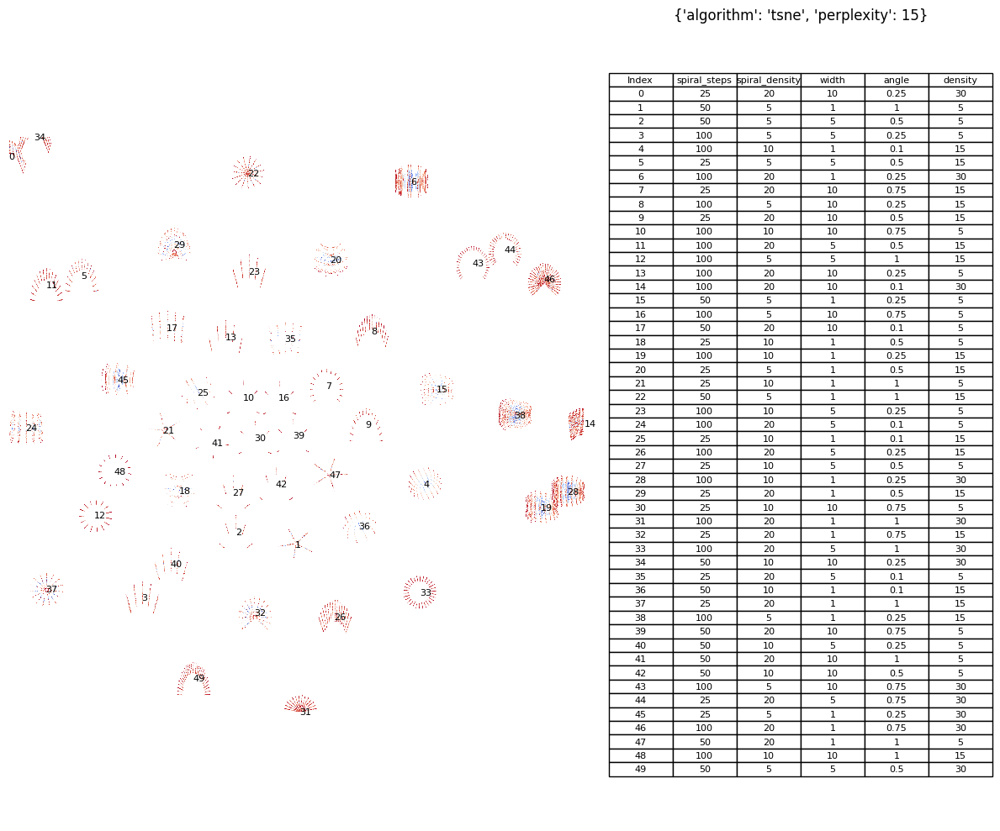

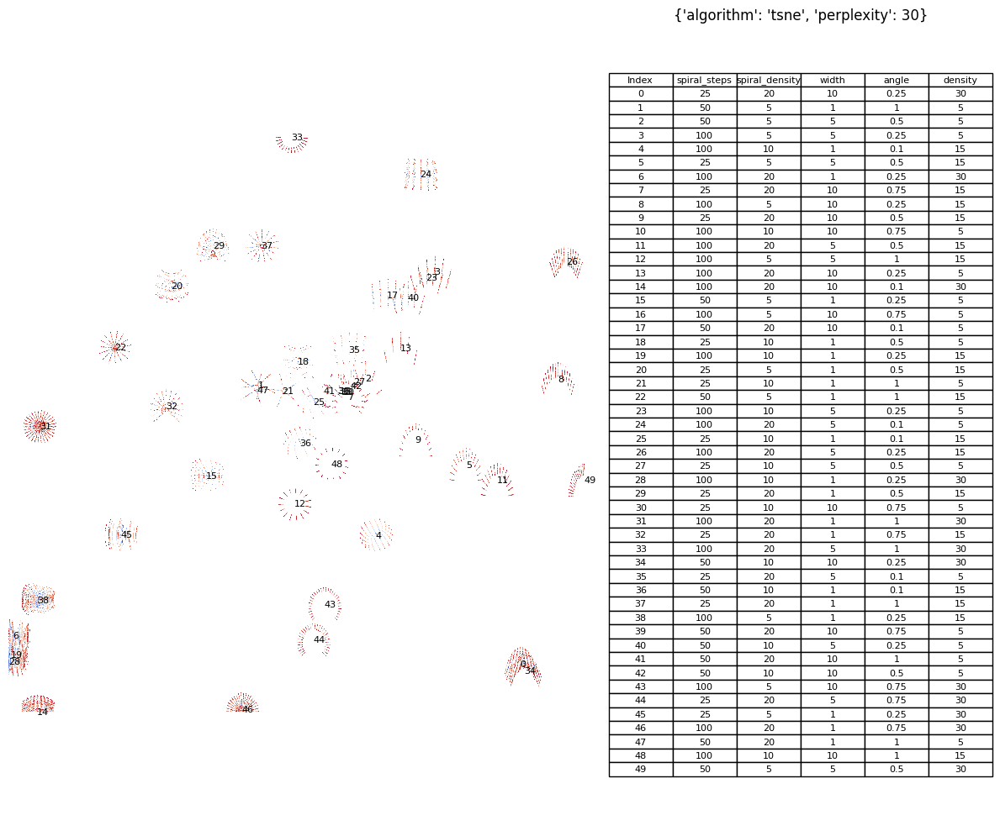

/Users/mnozkiewicz/Magisterka/Wizualizacja/venv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


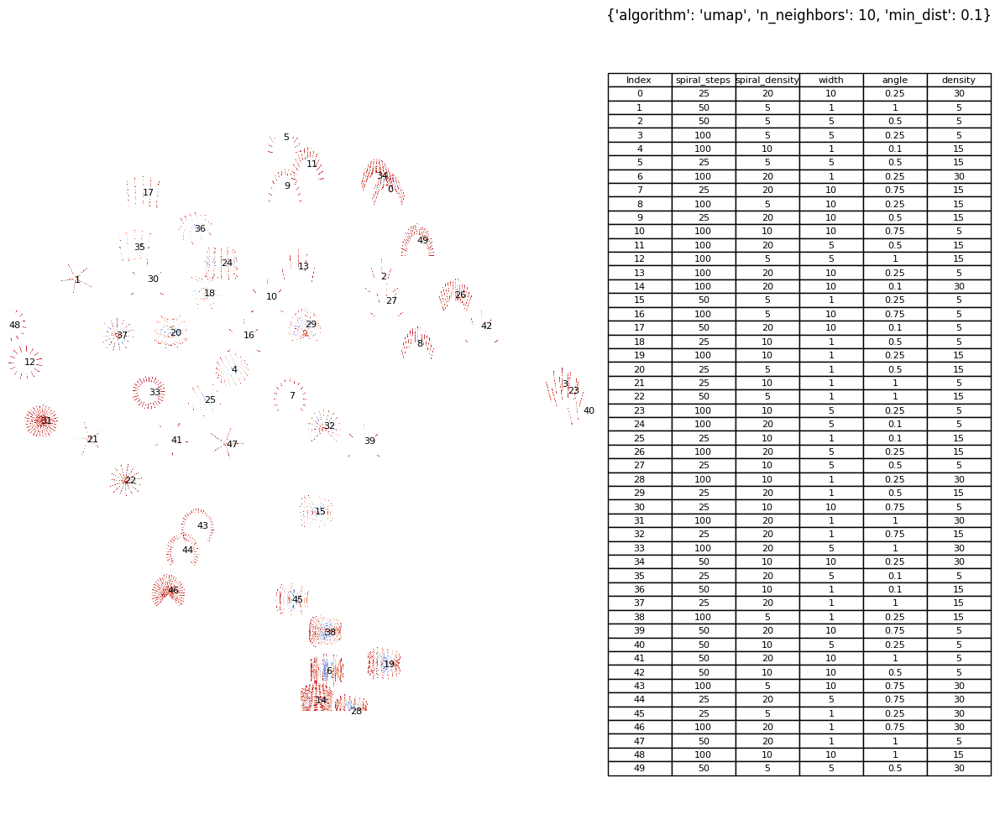

/Users/mnozkiewicz/Magisterka/Wizualizacja/venv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


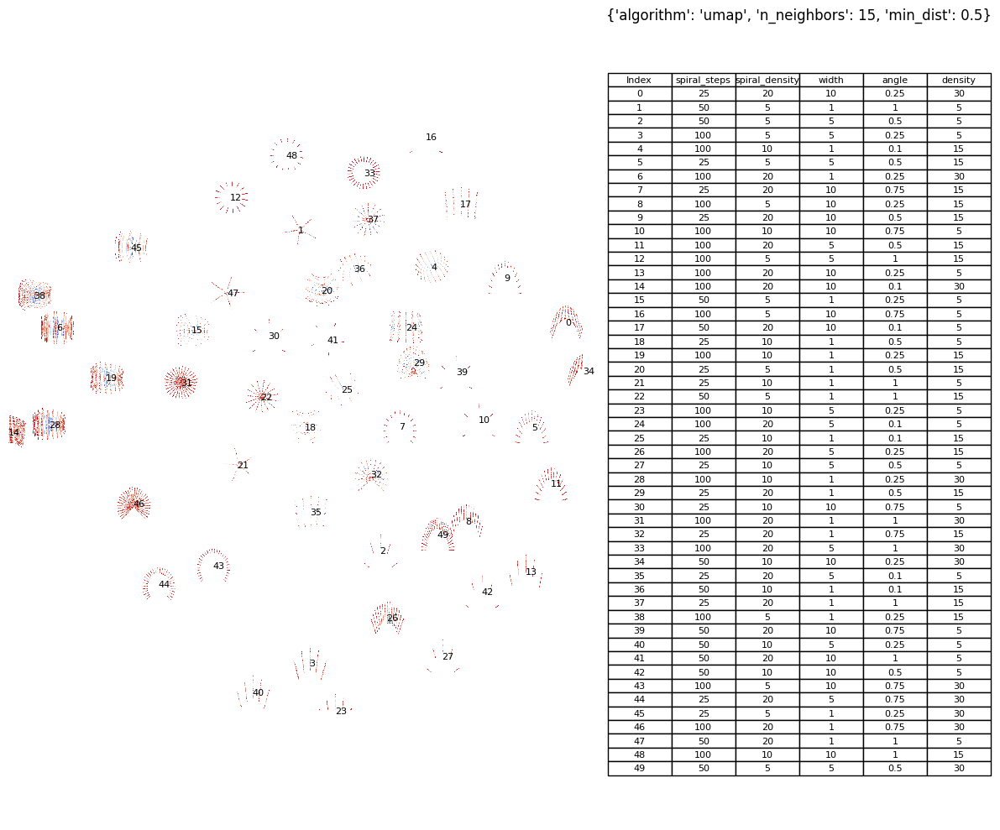

/Users/mnozkiewicz/Magisterka/Wizualizacja/venv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


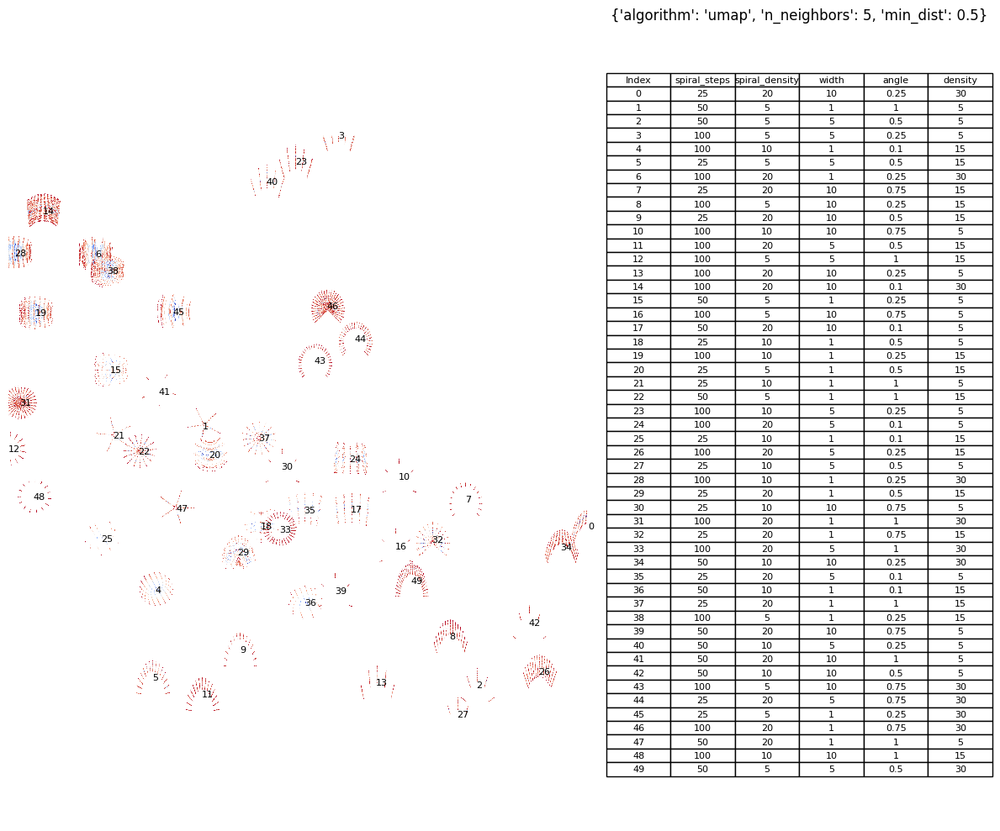

In [10]:
for param in parameters:
    points_embedded = embedd_points(image_data_points, **param)
    plot_embeddings_images(
        points_embedded,
        images,
        labels,
        size=0.04,
        **param
    )

For every visualization, I included miniature images of the roulades along with their corresponding indexes, which reference a table of parameters. 

The first method applied was Principal Component Analysis (PCA). As a linear technique, PCA struggled to capture the complex, nonlinear structures of the roulade shapes. Most samples were projected into a single, densely packed region, without meaningful separation between them. Only a few outliers stood apart, probably due to extreme values in certain parameters, like density, which appeared to have the most visible effect in separating samples. Overall, PCA was ineffective at preserving both local variations and global relationships in the data.

 The next method tested was t-distributed Stochastic Neighbor Embedding (t-SNE), where the outcome is highly sensitive to the perplexity parameter. At a low perplexity, the result resembled PCA in that most images were grouped into one large, dense cluster. Local neighborhoods were preserved, but the embedding failed to reveal meaningful global patterns. At higher perplexity values, the visualizations improved significantly. Clusters became more distinct and well-separated, making it easier to identify patterns based on spiral steps, density, and roll characteristics. The method also did a better job capturing global structure — for example, roulades with higher density tended to group in specific regions, separate from those with lower density. 
 
 UMAP (Uniform Manifold Approximation and Projection) produced results that seemed similar to those of t-SNE, especially in terms of preserving local relationships. However, UMAP’s clustering was slightly less distinct than t-SNE at higher perplexity levels. The boundaries between groups were more diffuse, which could make it harder to identify divisions between patterns. Still, UMAP remains a strong option for balancing local and global structure.

## Excercise 3 and Excercise 1

In [11]:
from mnists import MNIST

mnist = MNIST()
mnist_images = mnist.test_images()
mnist_labels = mnist.test_labels()
mnist_images = mnist_images.reshape(mnist_images.shape[0], -1)

fmnist_images = pd.read_csv("fashion_mnist/fashion-mnist_test.csv")
fmnist_labels = fmnist_images.pop("label")
fmnist_images = fmnist_images.to_numpy()
fmnist_labels = fmnist_labels.to_numpy()

In [12]:
fmnist_images.shape, mnist_images.shape

((10000, 784), (10000, 784))

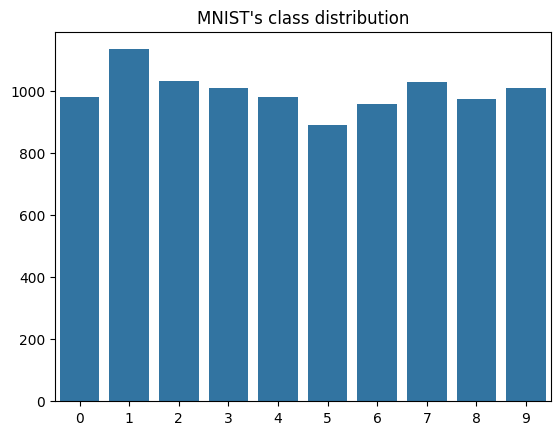

In [13]:
values, counts = np.unique_counts(mnist_labels)
sns.barplot(counts)
plt.title("MNIST's class distribution");

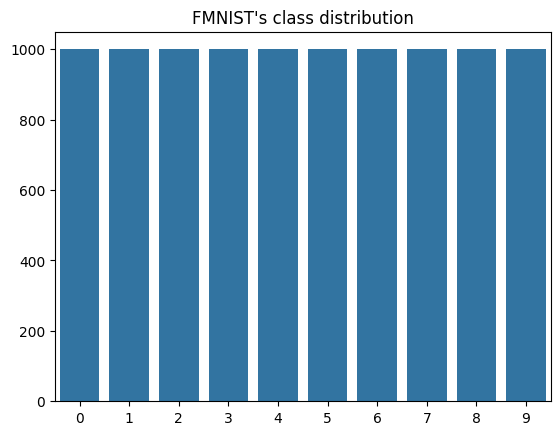

In [14]:
values, counts = np.unique_counts(fmnist_labels)
sns.barplot(counts)
plt.title("FMNIST's class distribution");

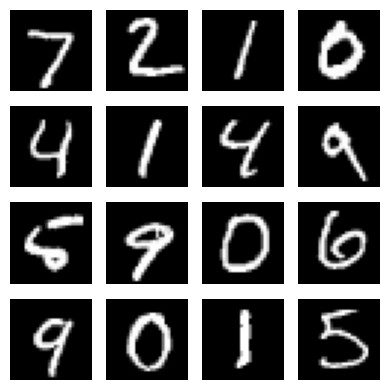

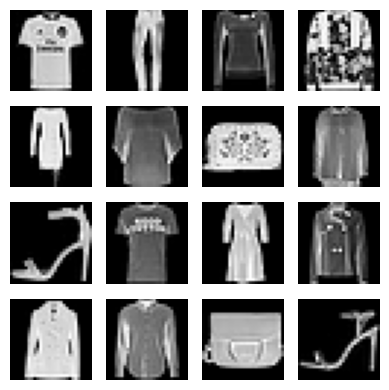

In [15]:
def draw_sample_images(digits: np.ndarray, rows: int, cols: int):
    fig, axes = plt.subplots(rows, cols, figsize=(4, 4))

    for i, ax in enumerate(axes.flat):
        ax.imshow(digits[i], cmap="gray")
        ax.axis("off")

    plt.tight_layout()
    plt.show()

draw_sample_images(mnist_images[:16].reshape(16, 28, 28), 4, 4)
draw_sample_images(fmnist_images[:16].reshape(16, 28, 28), 4, 4)

In [16]:
def plot_2d_points(transformed: np.ndarray, labels: np.ndarray, **param):
    
    df = pd.DataFrame({
        'x': transformed[:, 0],
        'y': transformed[:, 1],
        'label': labels
    })

    unique_labels = np.unique(labels)
    base_palette = sns.color_palette("tab10", n_colors=10)
    label_to_color = {label: base_palette[i] for i, label in enumerate(unique_labels)}

    plt.figure(figsize=(8, 6))
    sns.scatterplot(data=df, x='x', y='y', hue='label', edgecolor='k', palette=label_to_color, s=40)
    plt.legend(title='Label')

    plt.title(param)
    plt.show()


def compute_boundaries(
        middle: int, 
        image_size: int = 28,
        whole_image_size: int = 1000
        
    ) -> tuple[int, int]:
    half_size = image_size // 2

    if middle - half_size < 0:
        left = 0
        right = image_size
    elif middle + half_size >= whole_image_size:
        right = whole_image_size - 1
        left = right - image_size
    else:
        left, right = middle - half_size, middle + half_size

    return left, right


def draw_miniature_images(
    embeddings: np.ndarray, 
    images: list[Image.Image] | list[np.ndarray], 
    figsize: tuple[int, int] = (8, 8),
    image_scale: int  = 30,
    transparent: bool = False
):
    
    images = list(map(np.array, images))
    single_image_size = images[0].shape[0]
    whole_image_size = single_image_size * image_scale
    final_image = np.full((whole_image_size, whole_image_size), 255, dtype=np.uint8)


    shifted = embeddings - embeddings.min(axis=0)
    normalized = shifted / shifted.max(axis=0)

    for i, (x, y) in enumerate(normalized):
        s_x, s_y = int(x*whole_image_size), whole_image_size - int(y * whole_image_size)
        up, down = compute_boundaries(s_x, single_image_size, whole_image_size)
        left, right = compute_boundaries(s_y, single_image_size, whole_image_size)

        if transparent:
            final_image[left:right, up:down] = np.minimum(final_image[left:right, up:down], images[i])
        else:
            final_image[left:right, up:down] = images[i]

    _, ax = plt.subplots(figsize=figsize)
    ax.imshow(final_image,  cmap="gray")
    ax.axis("off")
    plt.show()

## MNIST Visualizations

In [17]:
random_subset = np.random.permutation(np.arange(mnist_images.shape[0]))[:100]
images_subset = mnist_images[random_subset].reshape(-1, 28, 28)
images_subset = images_subset.max() - images_subset

In [18]:
parameters = [
    {"algorithm": "tsne", "perplexity": 5},
    {"algorithm": "tsne", "perplexity": 30},
    {"algorithm": "tsne", "perplexity": 50},
    {"algorithm": "umap", "n_neighbors": 5, "min_dist": 0.1},
    {"algorithm": "umap", "n_neighbors": 15, "min_dist": 0.5},
    {"algorithm": "umap", "n_neighbors": 30, "min_dist": 0.1},
    {"algorithm": "trimap", "n_inliers": 10, "n_outliers": 5},
    {"algorithm": "trimap", "n_inliers": 20, "n_outliers": 10},
    {"algorithm": "pacmap", "n_neighbors": 10, "MN_ratio": 0.5, "FP_ratio": 1.0},
    {"algorithm": "pacmap", "n_neighbors": 30, "MN_ratio": 0.8, "FP_ratio": 2.0},
]

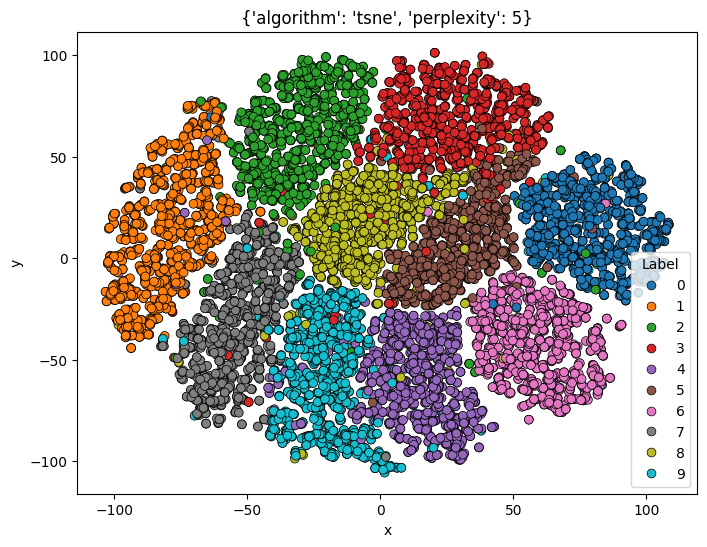

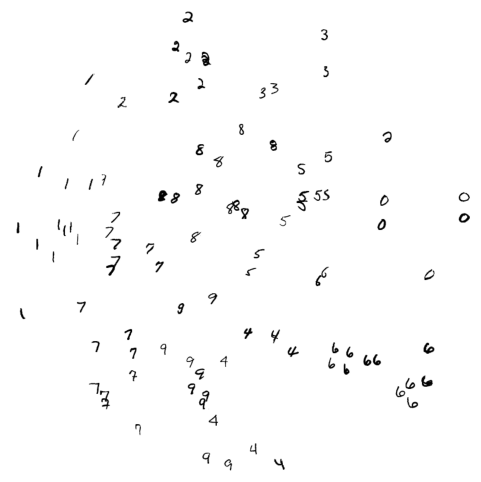

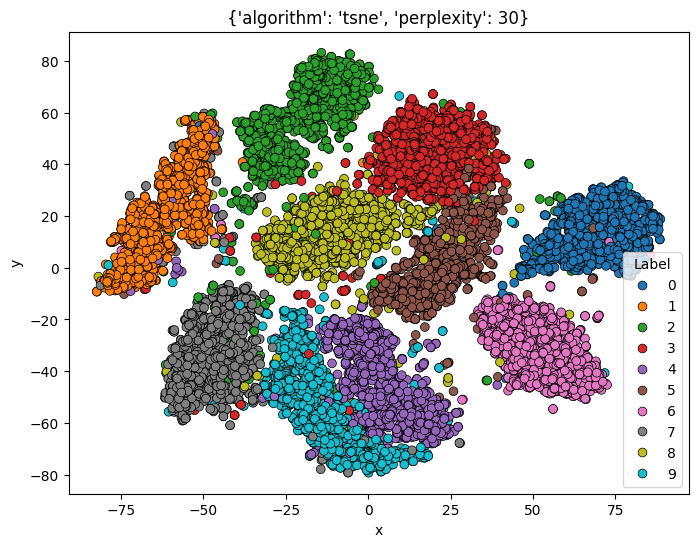

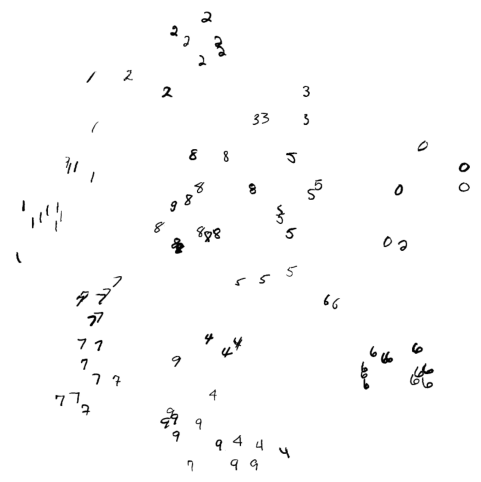

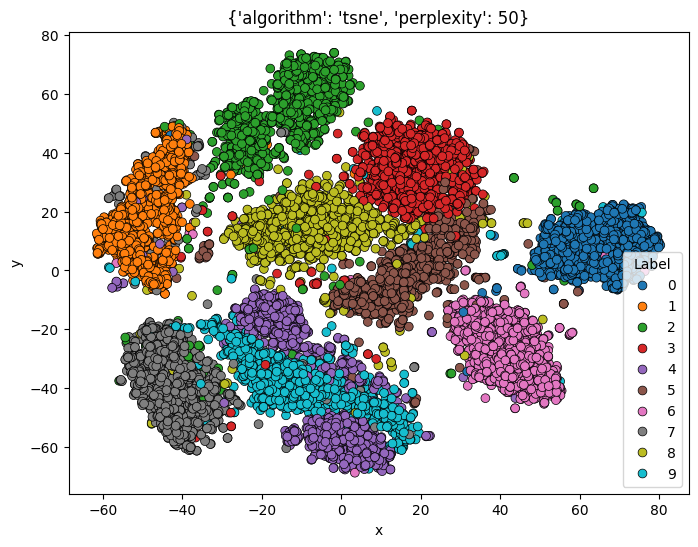

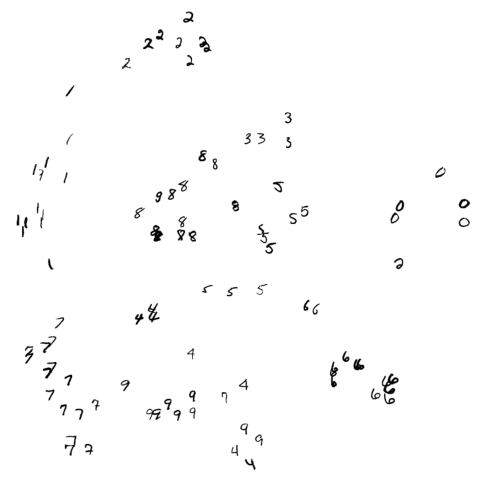

/Users/mnozkiewicz/Magisterka/Wizualizacja/venv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


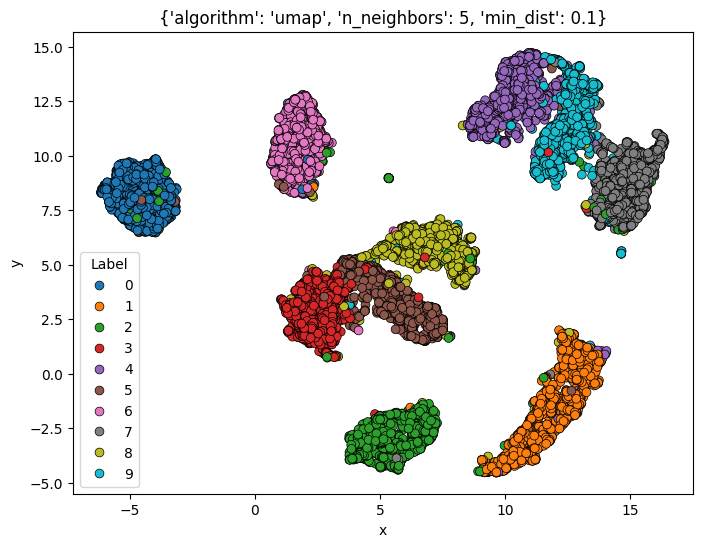

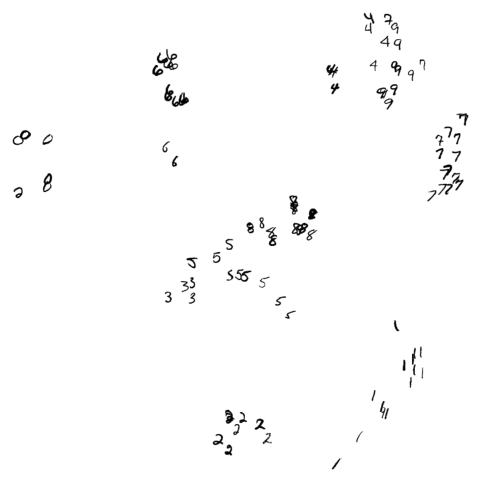

/Users/mnozkiewicz/Magisterka/Wizualizacja/venv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


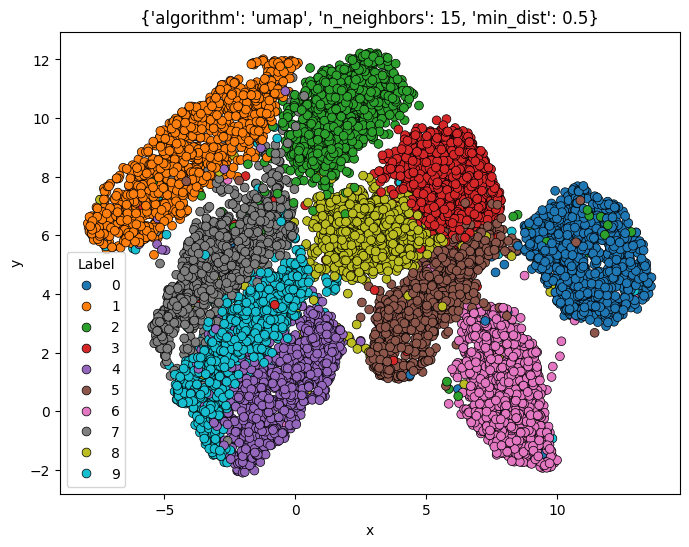

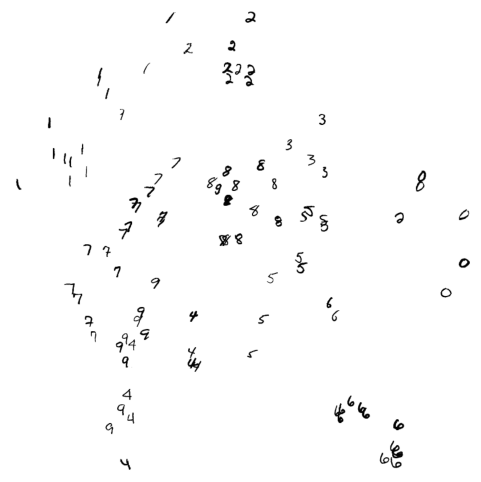

/Users/mnozkiewicz/Magisterka/Wizualizacja/venv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


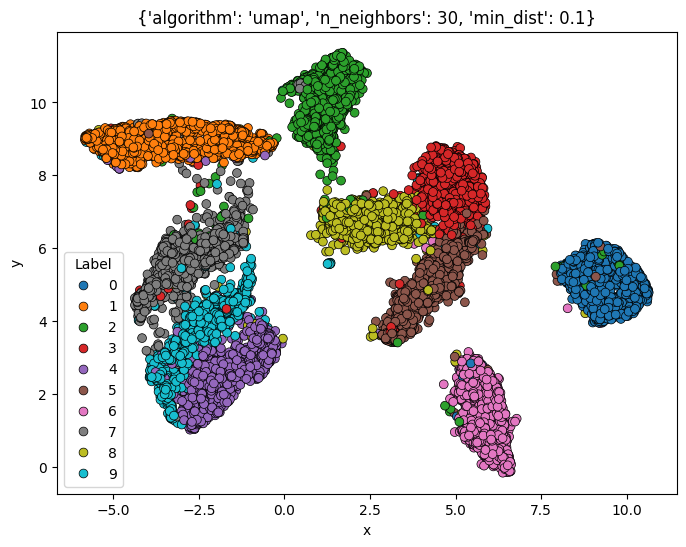

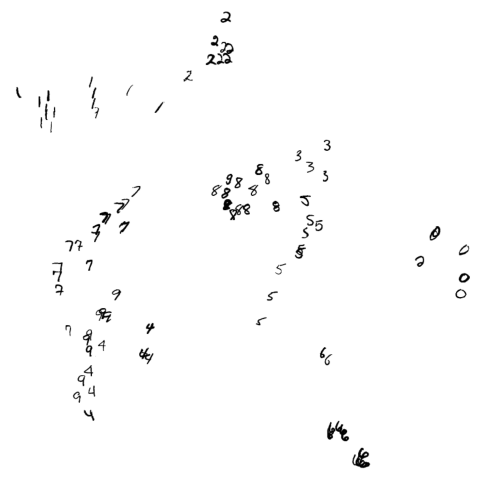

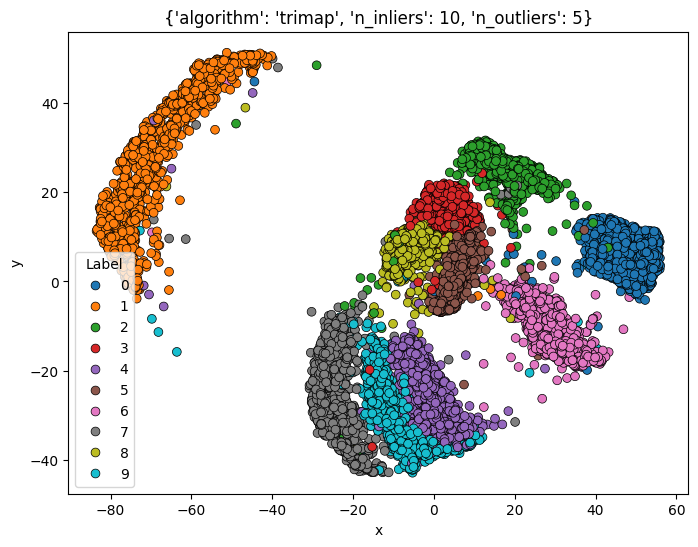

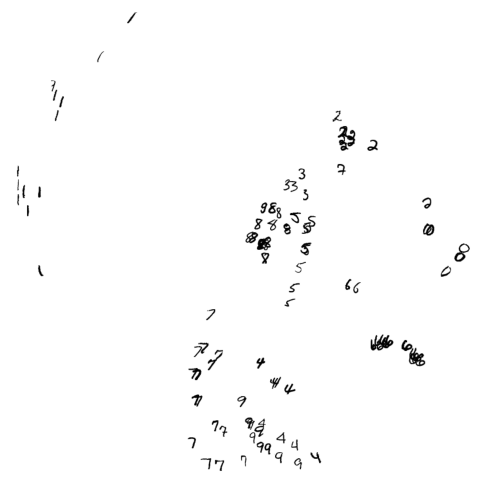

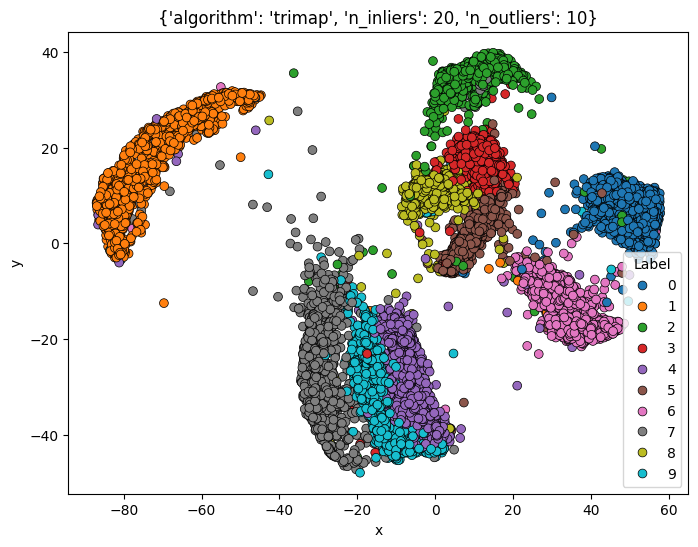

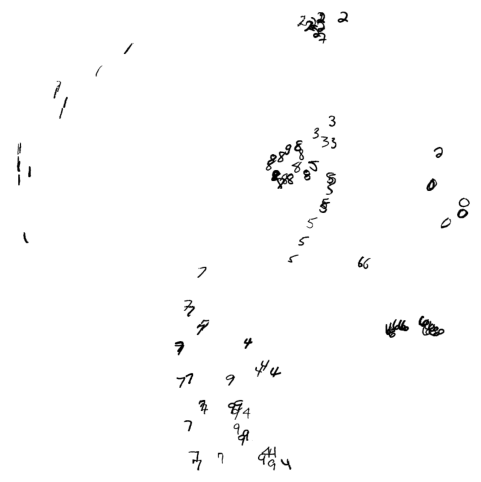

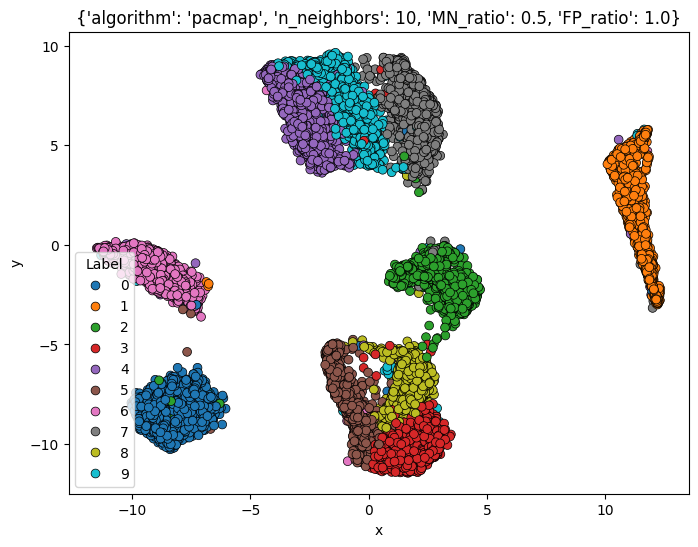

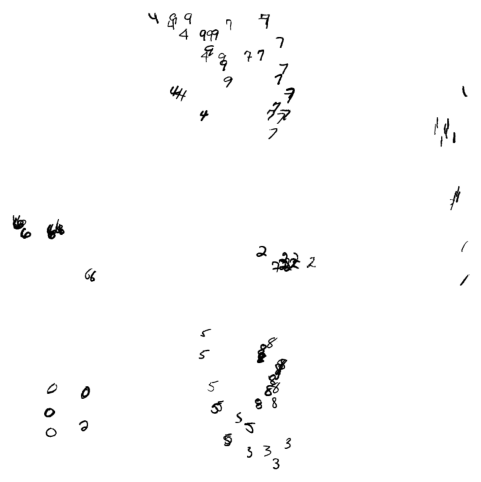

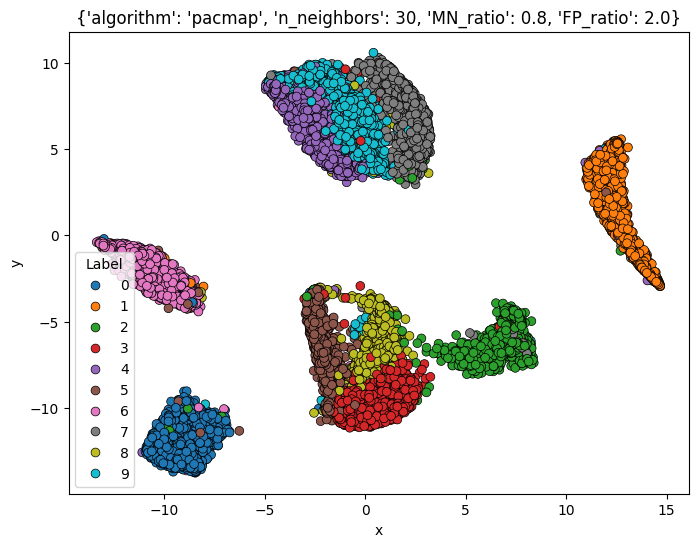

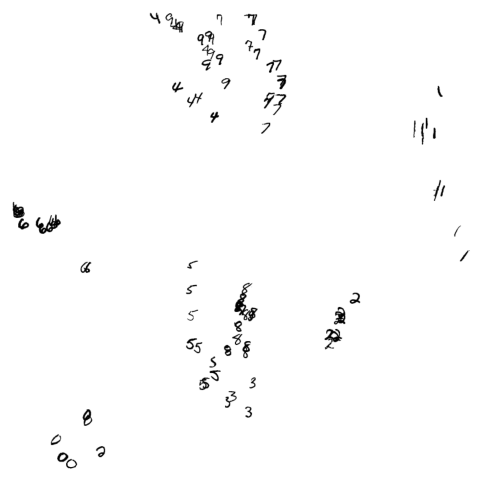

In [19]:
for param in parameters:
    transformed = embedd_points(mnist_images, **param)
    plot_2d_points(transformed, mnist_labels, **param)
    embeddings_subset = transformed[random_subset]
    draw_miniature_images(embeddings_subset, images_subset, transparent=True, image_scale=30, figsize=(6, 6))

### Class fidelity metric implemenation

In [20]:
from sklearn.neighbors import NearestNeighbors
from sklearn.manifold import trustworthiness


# The implementation computes class fidelity for number on neighbors equal to 1 to max_neighbors simultenously
# The final class-fidelity metric is the mean of the returned vector

def class_fidelity(embeddings: np.ndarray, labels: np.ndarray, max_neighbors: int) -> np.ndarray:

    nn = NearestNeighbors(n_neighbors=max_neighbors + 1)
    nn.fit(embeddings)

    neighbor_indices = nn.kneighbors(embeddings)[1][:, 1:] # every point has itself as its neighbor
    neighbor_labels = labels[neighbor_indices]
    matching_neighbors = neighbor_labels == labels.reshape(-1, 1)

    m = embeddings.shape[0]
    cf_nn = np.cumsum(matching_neighbors, axis=1).sum(axis=0) / (np.arange(1, 101) * m)

    return cf_nn

In [ ]:
from metrics import LocalMetric

local_metrics = LocalMetric()
trustworthiness_values = {}
class_fidelity_values = {}

for param in parameters:
    X_ld = embedd_points(mnist_images, **param)
    local_metrics.calculate_knn_gain_and_dr_quality(
        X_lds=X_ld,
        X_hds=mnist_images,
        labels=mnist_labels,
        method_name=str(param),
    )
    trustworthiness_values[str(param)] = trustworthiness(mnist_images, X_ld, n_neighbors=100)
    class_fidelity_values[str(param)] = class_fidelity(X_ld, mnist_labels, 100)

Finished.


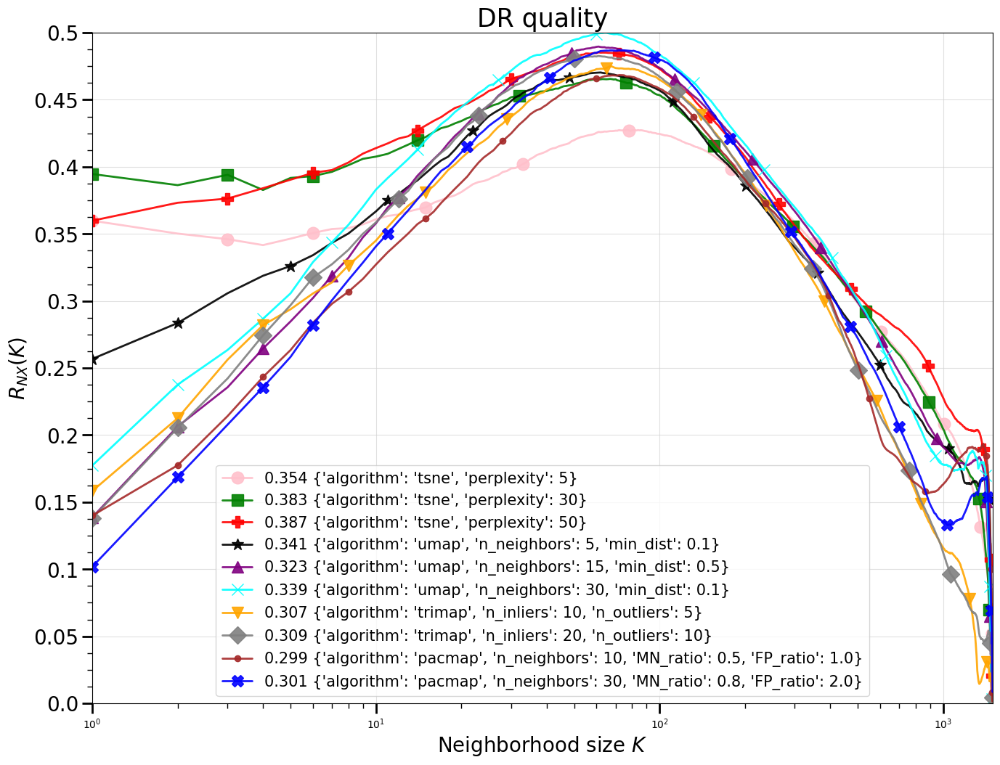

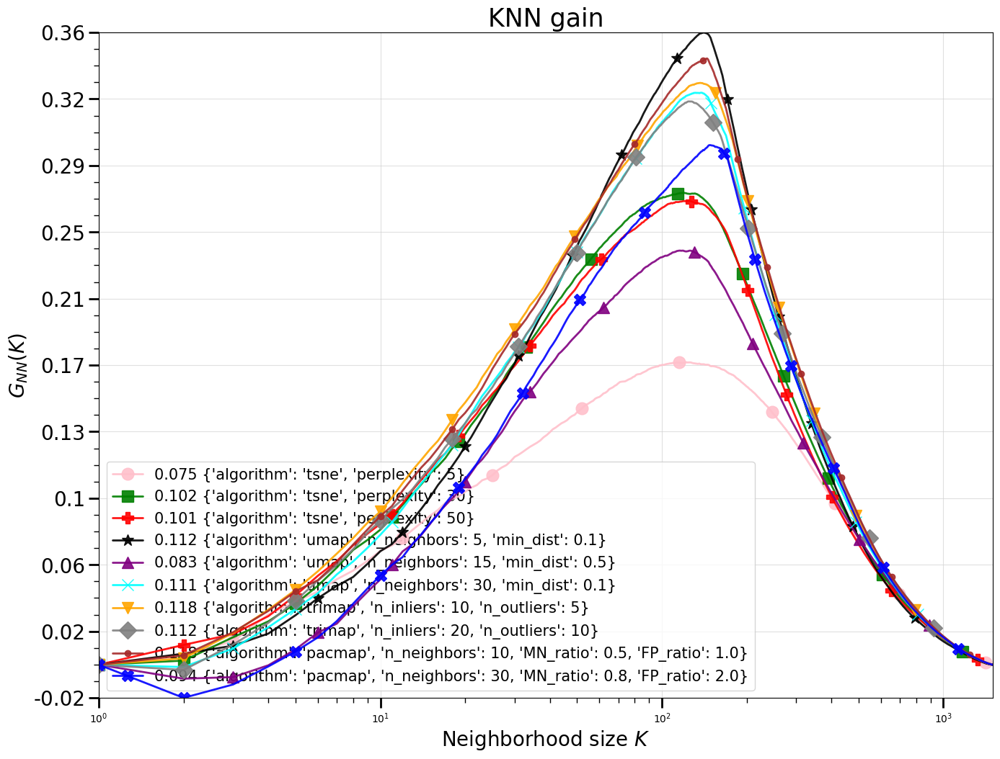

In [22]:
local_metrics.visualize()

In [23]:
from metrics import markers, colors

def compare_single_values(data: dict[str, float], title: str, min_y: float = 0.8) -> None:
    labels = [f"{eval(k)['algorithm']} {k.split(', ',1)[-1][:-1]}" for k in data]
    
    colors = [eval(k)["algorithm"] for k in data]
    color_map = {"tsne": "red", "umap": "blue", "trimap": "green", "pacmap": "orange"}
    bar_colors = [color_map[c] for c in colors]

    plt.figure(figsize=(10, 5))
    plt.bar(labels, data.values(), color=bar_colors, edgecolor="black")
    plt.xticks(rotation=45, ha='right')
    plt.ylim(min_y, 1.0)
    plt.tight_layout()
    plt.title(title)
    plt.show()


def plot_cf_nn(cf_nn_values: dict[str, np.ndarray]):
    fig, ax = plt.subplots(figsize=(16, 12))
    
    for i, (param, values) in enumerate(cf_nn_values.items()):
        ax.plot(values, marker=markers[i], c=colors[i], markevery=10, label=param)
    
    ax.set_title("CF NN Values by Parameter")
    ax.set_xlabel("Index")
    ax.set_ylabel("Value")
    ax.legend()
    plt.show()

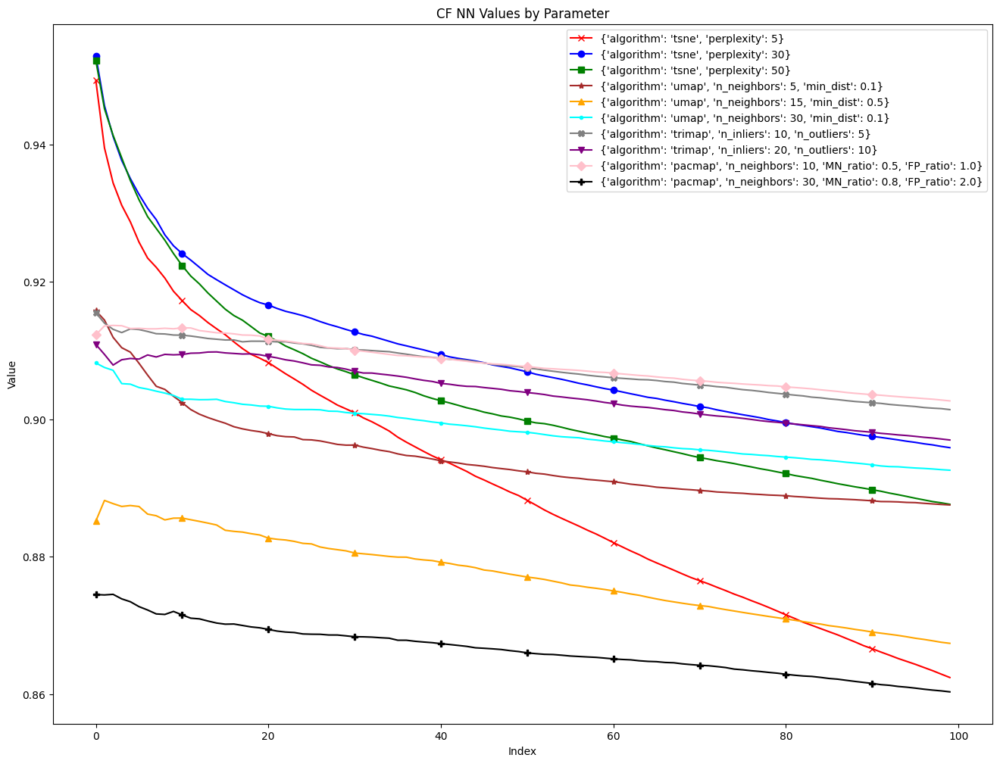

In [24]:
plot_cf_nn(class_fidelity_values)

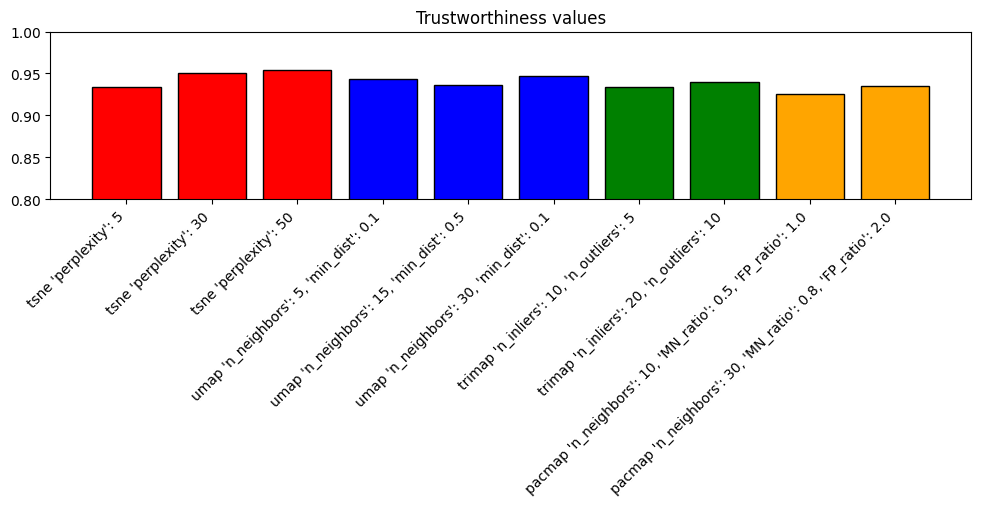

In [27]:
compare_single_values(trustworthiness_values, "Trustworthiness values")

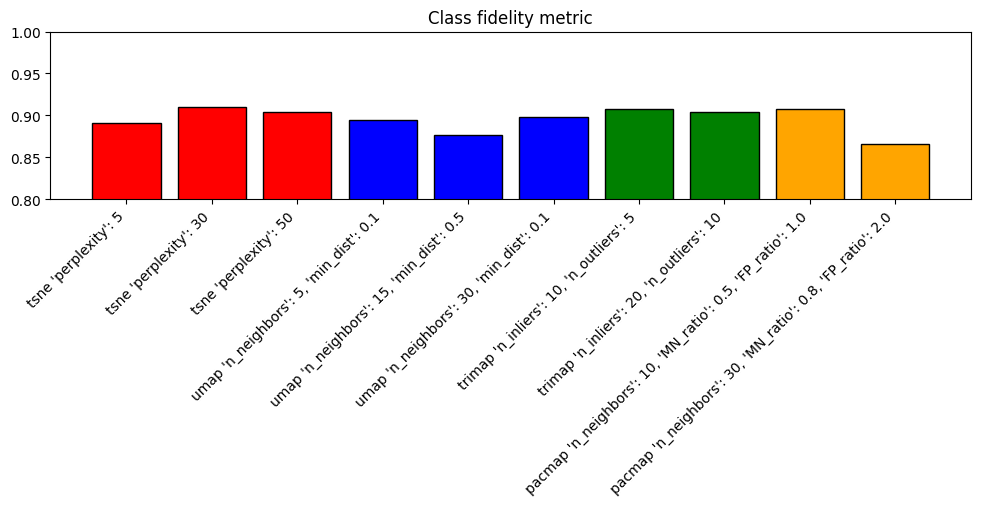

In [28]:
compare_single_values({
    key: value.mean()
        for key, value in class_fidelity_values.items()
    },  
    "Class fidelity metric"
)

Analysis part 1 - MNIST

MNIST is not a particularly challenging dataset to cluster. All four dimensionality reduction methods—t-SNE, UMAP, TriMAP, and PaCMAP—were able to uncover meaningful structure, though the quality and characteristics of the embeddings varied depending on the chosen parameters.

The high quality of embeddings was evident both visually and through computed metrics such as class fidelity, KNN-gain, DR-quality, and trustworthiness.

t-SNE performed very well across all configurations. At lower perplexity values, it produced tight, well-separated clusters. As perplexity increased, the global structure improved, and clusters became more spaced out. One of t-SNE’s strengths was its ability to capture fine-grained local relationships—similar digits were consistently placed near each other in dense neighborhoods. However, t-SNE came at a high computational cost and was the most sensitive to parameter tuning.

UMAP produced similar results, but with a better balance between local and global structure. Classes like '0', '1', and '2' were clearly separated, while visually similar digits such as '3', '5', and '9' were positioned nearby without overlapping. Compared to t-SNE, UMAP was more effective at preserving global layout and required less computational time.

TriMAP generated embeddings comparable to those of t-SNE and UMAP. However, in several configurations, the digit '1' formed a distinct cluster located far from the rest, which was somewhat unusual. Despite that, TriMAP generally preserved both local and global structures reasonably well, and was notably efficient in terms of computation.

PaCMAP delivered what appeared to be the most balanced results. Its embeddings were similar to UMAP’s in terms of structure, grouping visually similar digits together while keeping different digits well-separated. It also maintained a good global organization without requiring extensive tuning.

In terms of quantitative performance, all methods achieved class fidelity scores around 0.9, with TriMAP and t-SNE slightly outperforming the rest. Other metrics like trustworthiness and DR-quality were also consistently high across all four methods, further validating the quality of the embeddings.

In summary, for MNIST, UMAP and PaCMAP stood out as the most effective methods, offering a combination of fast computation, strong local structure, and clear global layout. t-SNE was highly accurate but more computationally expensive and sensitive to hyperparameters. TriMAP was lightweight and competent but showed occasional irregularities in its output.

## FMNIST Visualisations

In [29]:
random_subset = np.random.permutation(np.arange(fmnist_images.shape[0]))[:100]
images_subset = fmnist_images[random_subset].reshape(-1, 28, 28)
images_subset = images_subset.max() - images_subset

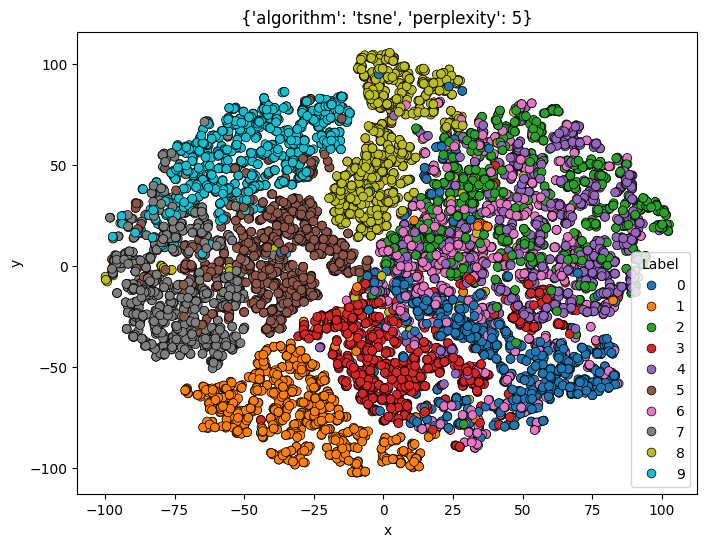

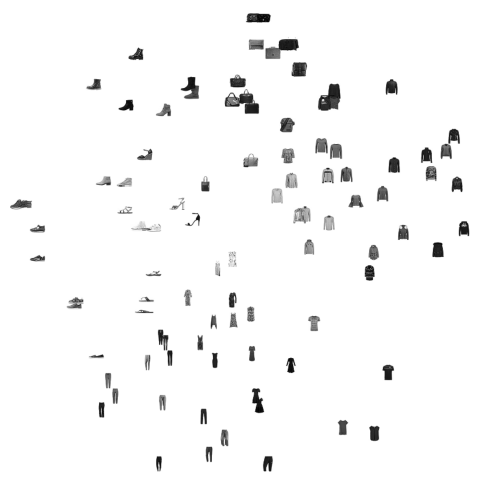

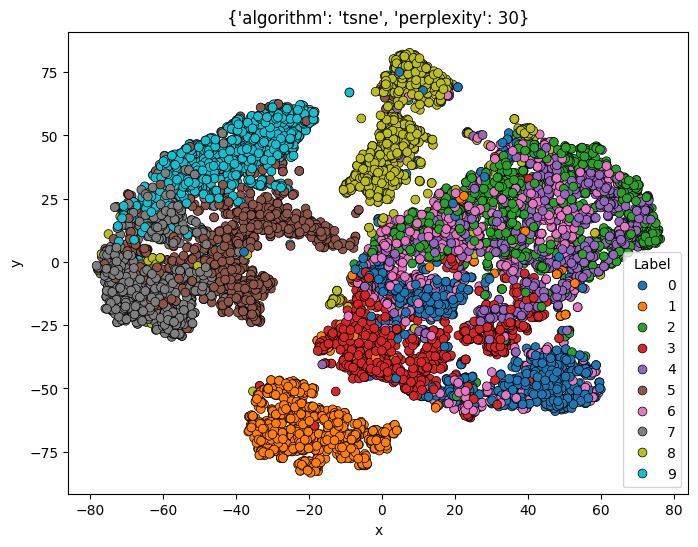

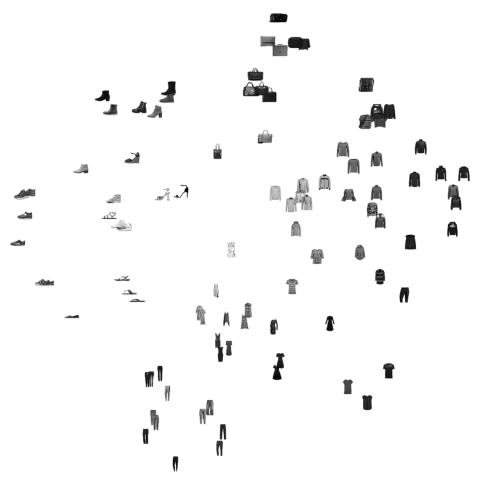

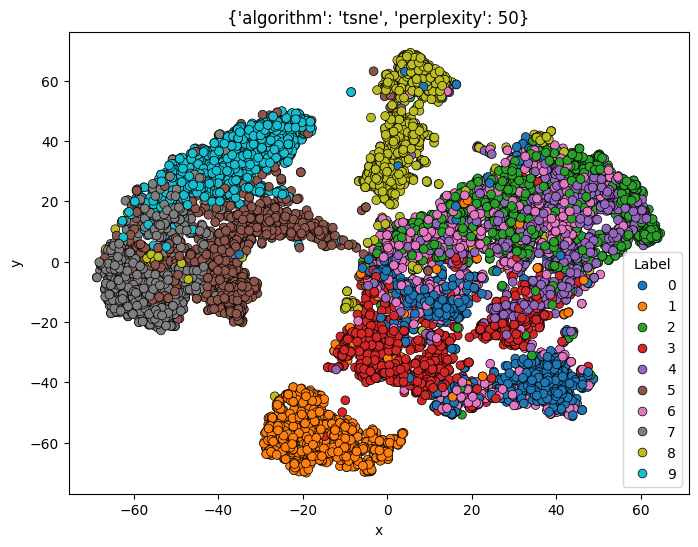

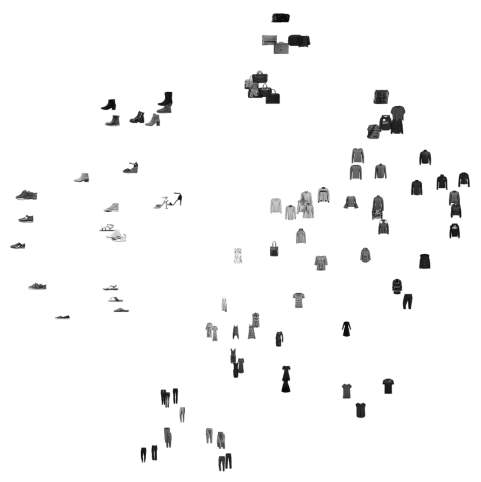

/Users/mnozkiewicz/Magisterka/Wizualizacja/venv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


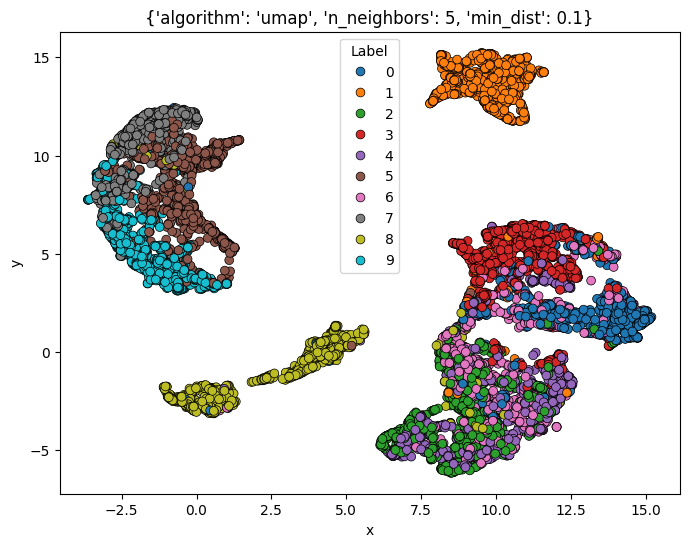

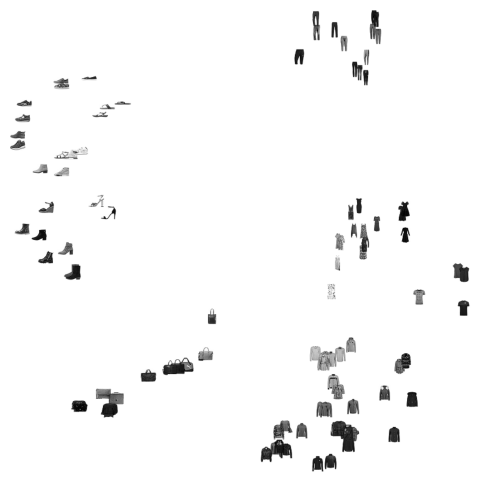

/Users/mnozkiewicz/Magisterka/Wizualizacja/venv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


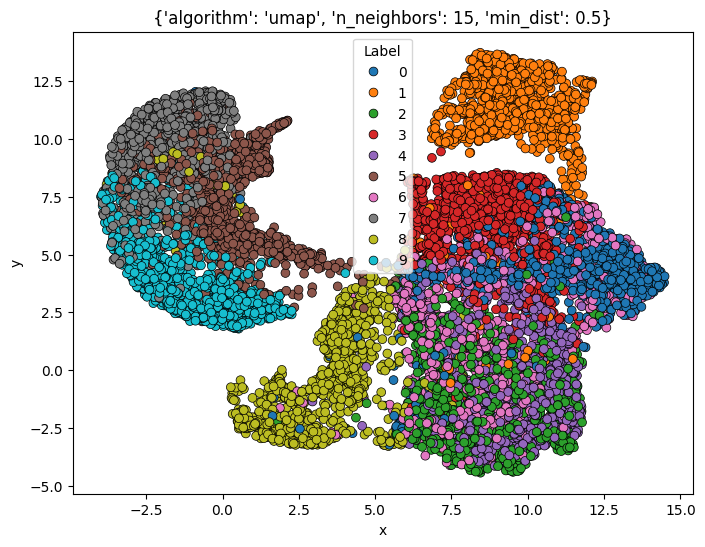

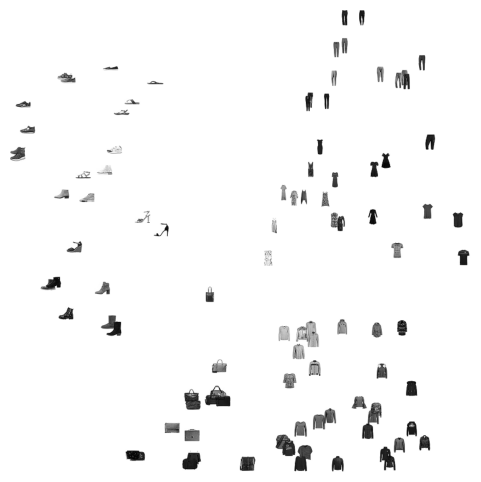

/Users/mnozkiewicz/Magisterka/Wizualizacja/venv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


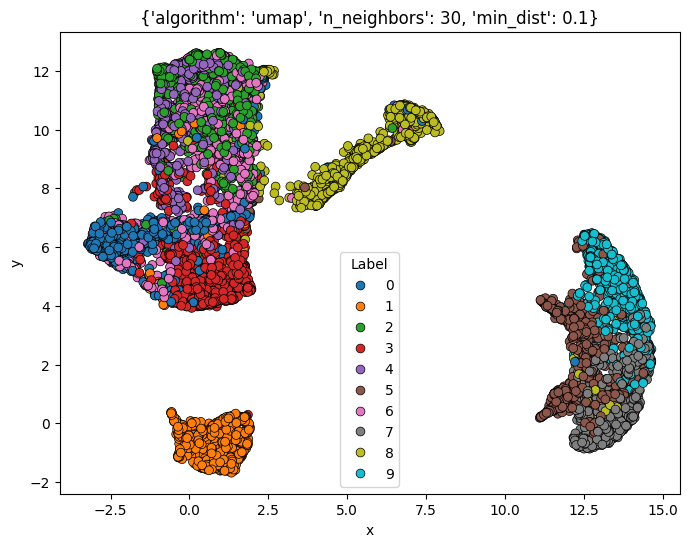

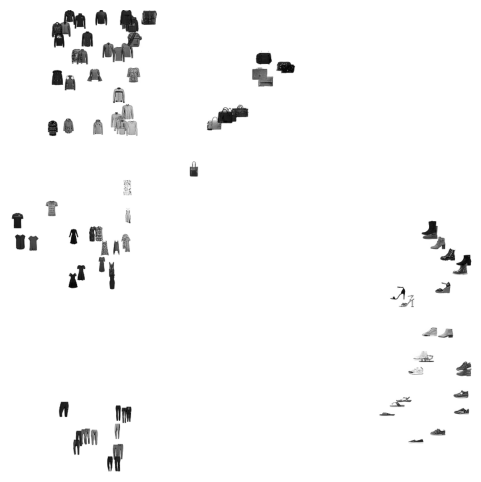

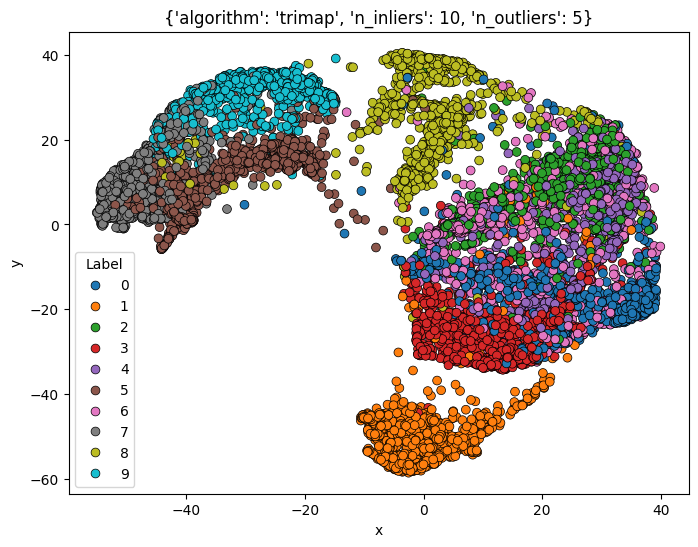

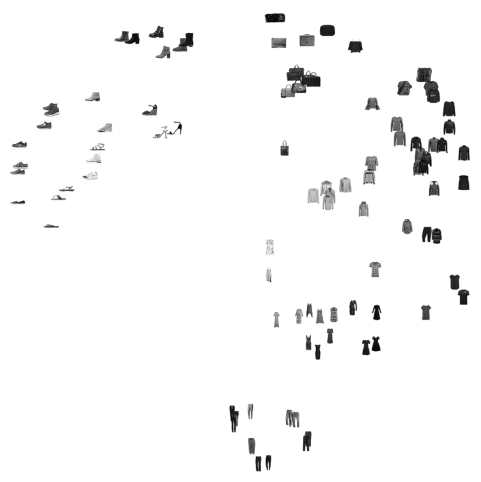

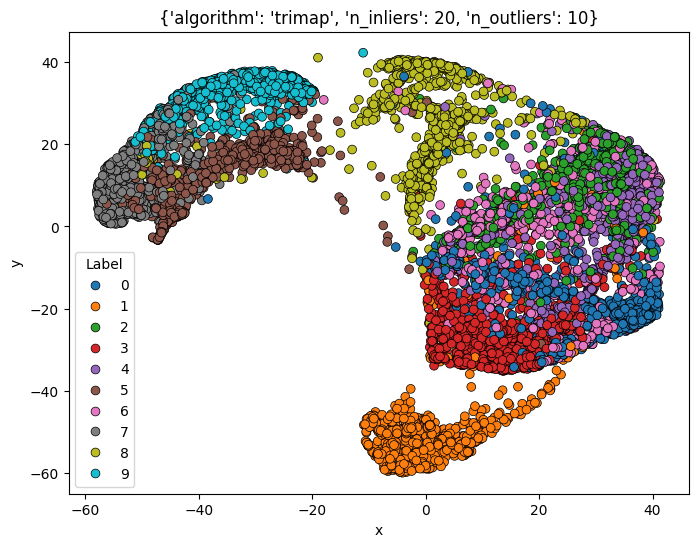

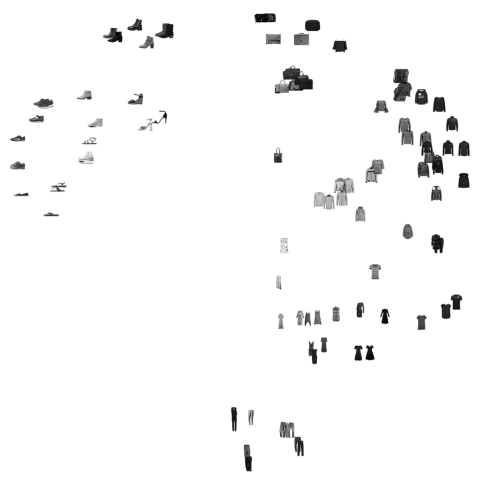

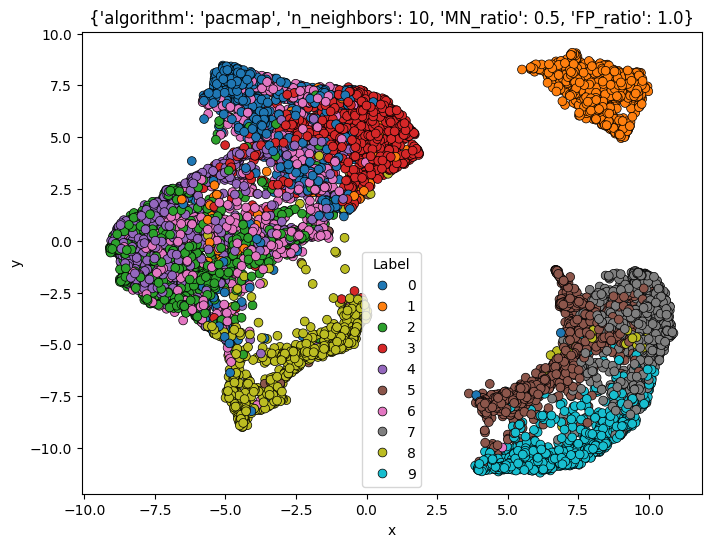

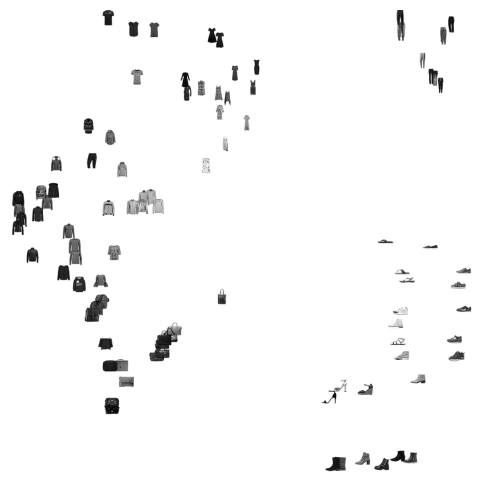

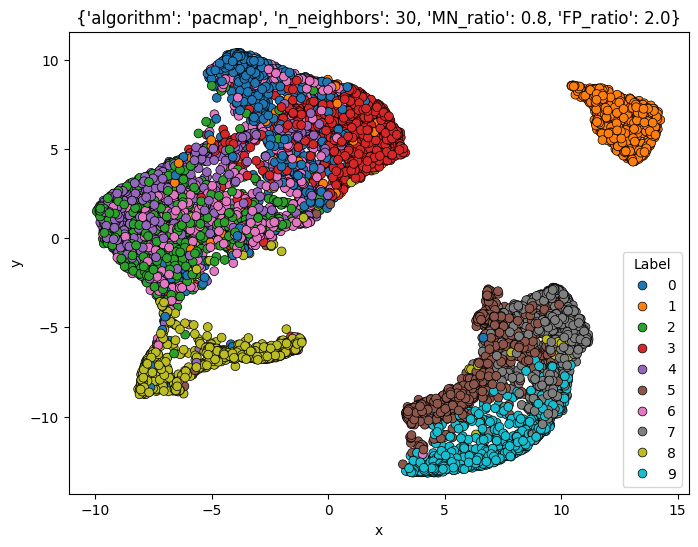

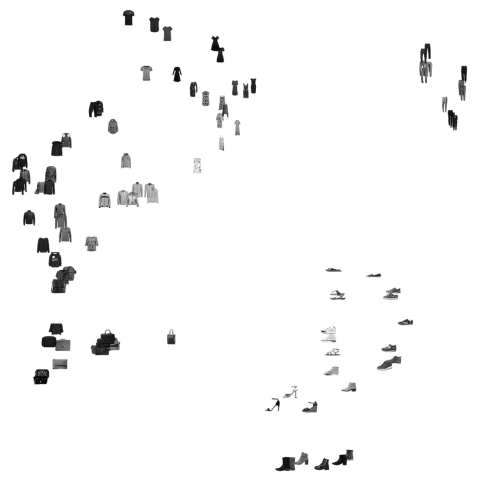

In [30]:
for param in parameters:
    transformed = embedd_points(fmnist_images, **param)
    plot_2d_points(transformed, fmnist_labels, **param)
    embeddings_subset = transformed[random_subset]
    draw_miniature_images(embeddings_subset, images_subset, transparent=True, image_scale=30, figsize=(6, 6))

In [ ]:
local_metrics = LocalMetric()
trustworthiness_values = {}
class_fidelity_values = {}

for param in parameters:
    X_ld = embedd_points(fmnist_images, **param)
    local_metrics.calculate_knn_gain_and_dr_quality(
        X_lds=X_ld,
        X_hds=fmnist_images,
        labels=fmnist_labels,
        method_name=str(param),
    )
    trustworthiness_values[str(param)] = trustworthiness(fmnist_images, X_ld, n_neighbors=100)
    class_fidelity_values[str(param)] = class_fidelity(X_ld, fmnist_labels, 100)

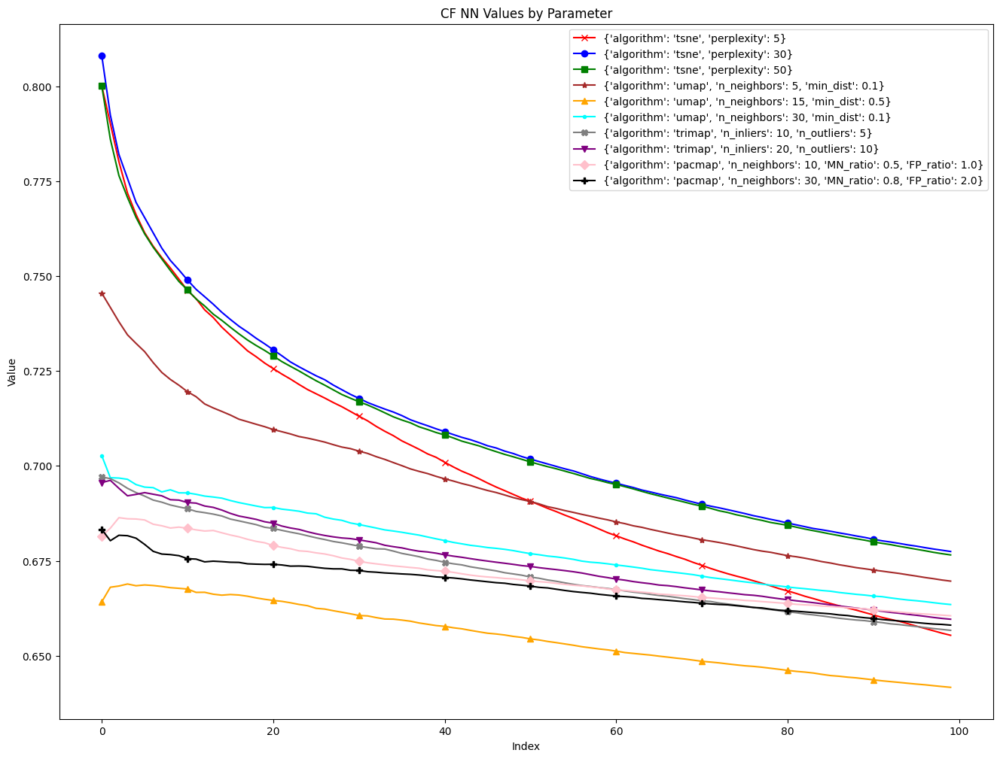

In [32]:
plot_cf_nn(class_fidelity_values)

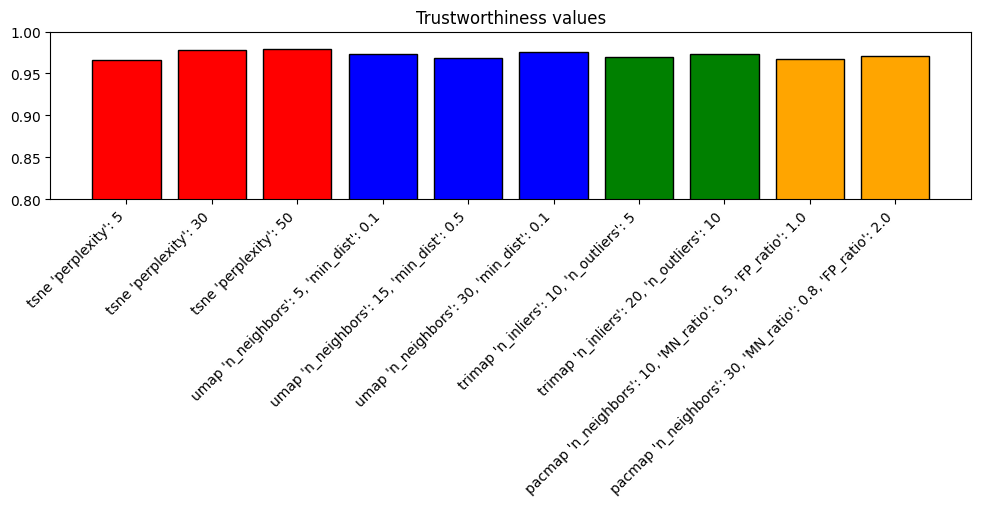

In [33]:
compare_single_values(trustworthiness_values, "Trustworthiness values")

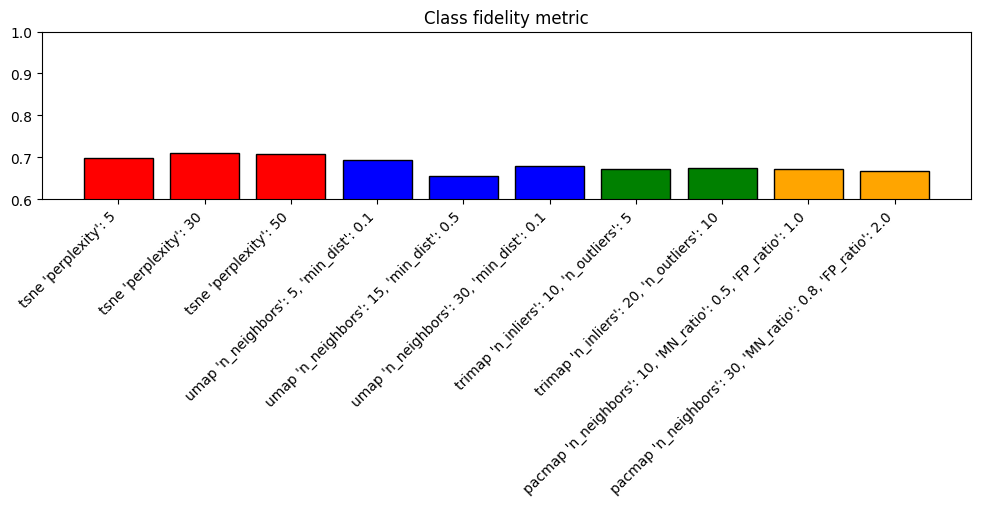

In [34]:
compare_single_values({
    key: value.mean()
        for key, value in class_fidelity_values.items()
    },  
    "Class fidelity metric",
    min_y=0.6
)

Analysis part 2 - FMNIST

Fashion MNIST posed a greater challenge for dimensionality reduction methods compared to MNIST. The classes are visually more complex and often overlapping, which made it harder to obtain clear, distinct clusters. While all four methods—t-SNE, UMAP, TriMAP, and PaCMAP—were still able to uncover some meaningful structure, the results were generally more mixed.

Visually and quantitatively, t-SNE produced strong results, though not as consistently as on MNIST. At low perplexity, the clusters were very tight, but many class overlaps remained. Classes like 'Sneaker' and 'Ankle boot' were usually well-separated, while others like 'Shirt', 'top', and 'Coat' often appeared entangled.

UMAP appeared to be more sensitive to hypereparameters for this dataset. It was able to produce class separations for most classes but in many cases. However, overlap between visually similar clothing items like 'Shirt', 'Top', and 'Coat' was still present in most embeddings.

TriMAP performed reasonably but showed limitations on this dataset. While it preserved general class structure, the clusters were less compact and often had fuzzier boundaries. Similar classes frequently blended together, and in some configurations, the overall layout lacked interpretability. 

PaCMAP achieved very promising results but had similar issues to former methods.

Quantitatively, Fashion MNIST produced slightly lower class fidelity scores compared to MNIST across all methods, reflecting the increased difficulty of the task. The results were on the level of 0.7.

In summary, for Fashion MNIST, all methods stuggled and were not able to distinct between all the classes.